In [ ]:
import os
os.chdir("/content/drive/MyDrive/Deep Learning/ANN Pizza")

In [ ]:
pwd

'/content/drive/MyDrive/Deep Learning/ANN Pizza'

In [ ]:
!dir

Class_Demo_ANN.ipynb  model_ANN.h5     test   test.zip	train1
flagged		      Pizza_ANN.ipynb  test1  train	train.zip


In [ ]:
# Import libraries and packages
import matplotlib as plt
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , accuracy_score, classification_report
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import SGD
from imutils import paths
import numpy as np
import random
import pickle
import cv2
import os
import time   
import warnings
from tqdm import tqdm_notebook as tqdm
import itertools

warnings.filterwarnings("ignore")
SEED = 42   # set random seed

In [ ]:

!pip install patool
import patoolib
patoolib.extract_archive("train.zip")
patoolib.extract_archive("test.zip") 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 4.8 MB/s eta 0:00:00
patool: Extracting train.zip ...
patool: running /usr/bin/7z x -o./Unpack_h2tkhh0f -- train.zip
patool: ... train.zip extracted to `train2' (local file exists).
patool: Extracting test.zip ...
patool: running /usr/bin/7z x -o./Unpack_2_rou6qt -- test.zip
patool: ... test.zip extracted to `test2' (local file exists).


'test2'

In [ ]:
!dir

Class_Demo_ANN.ipynb  model_ANN.h5     test   test2	train	train2
flagged		      Pizza_ANN.ipynb  test1  test.zip	train1	train.zip


In [ ]:
# initialize the dataa and labels
print("[INFO] loading images...")
time1 = time.time() #to measure time taken
data = []
labels = []
classes = ["Burnt_pizza","Good_pizza"]

#grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images('train'))) 
random.seed(SEED)
random.shuffle(imagePaths)

#Progress Bar
with tqdm(total=len(imagePaths)) as pbar:

    #loop over the input images
     for imagePath in imagePaths:
         
         image = cv2.imread(imagePath)
         image = cv2.resize(image, (32, 32)).flatten()
         data.append(image)


         #extract the class label from the image path and update the labels list
         label = imagePath.split(os.path.sep)[-2]

         label = 1 if label == "Good_pizza" else 0
         labels.append(label)

         #update the progressbar
         pbar.update(1)


# scale the raw pixel intensities to the range [0,1]
data = np.array(data, dtype="float") / 255.0 
labels = np.array(labels)

print('Time taken: {:.1f} seconds'.format(time.time() - time1)) # to measure time taken
print("done")

[INFO] loading images...


  0%|          | 0/709 [00:00<?, ?it/s]

Time taken: 132.0 seconds
done


### Step 3: Creating your training and testing splits

In [ ]:
#partition the data into 80% training and 20% validation
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.2, random_state=SEED)

In [ ]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(testY.shape)

(567, 3072)
(567,)
(142, 3072)
(142,)


In [ ]:
# convert the labels from intergers/categories to vectors

trainY = to_categorical(trainY, num_classes=2)#fit_transfer = find all unqiue class labels
testY = to_categorical(testY, num_classes=2) #transform = perform one hot encoding

In [ ]:
trainX

array([[0.86666667, 0.85882353, 0.81960784, ..., 0.23921569, 0.2627451 ,
        0.80784314],
       [0.09019608, 0.49803922, 0.85098039, ..., 0.2745098 , 0.63921569,
        0.88627451],
       [0.99607843, 0.99607843, 0.99607843, ..., 0.99607843, 0.99607843,
        0.99607843],
       ...,
       [0.07058824, 0.16078431, 0.37647059, ..., 0.86666667, 0.89411765,
        0.95294118],
       [0.06666667, 0.09019608, 0.2       , ..., 0.17254902, 0.19215686,
        0.2627451 ],
       [0.23921569, 0.25098039, 0.25098039, ..., 0.7254902 , 0.72156863,
        0.71764706]])

In [ ]:
# Define the 3072-1024-512-2 archirecture using Keras

model = Sequential()


model.add(Dense(units= 1024, input_shape=(3072,), kernel_initializer = 'uniform', activation="relu"))

model.add(Dense(units= 800, kernel_initializer = 'uniform', activation="relu"))

model.add(Dense(units=512, kernel_initializer='uniform', activation="relu"))

#output layer with number of possible class labels
model.add(Dense(units=2, kernel_initializer="uniform", activation="softmax"))

In [ ]:
INIT_LR=0.01

In [ ]:
opt = SGD(lr=INIT_LR) #Stochastic Gradient Descent (SGD) optimizer
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dense_1 (Dense)             (None, 800)               820000    
                                                                 
 dense_2 (Dense)             (None, 512)               410112    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 4,377,890
Trainable params: 4,377,890
Non-trainable params: 0
_________________________________________________________________


### Step 7: Training your model on your training data

In [ ]:
EPOCHS = 50
H = model.fit(trainX, trainY, validation_data=(testX,testY),epochs=EPOCHS, batch_size=32)

Epoch 1/50
18/18 [==============================] - 7s 30ms/step - loss: 0.6543 - accuracy: 0.5944 - val_loss: 0.6722 - val_accuracy: 0.5493
Epoch 2/50
18/18 [==============================] - 0s 12ms/step - loss: 0.6173 - accuracy: 0.6226 - val_loss: 0.6683 - val_accuracy: 0.5493
Epoch 3/50
18/18 [==============================] - 0s 11ms/step - loss: 0.6013 - accuracy: 0.6226 - val_loss: 0.6539 - val_accuracy: 0.5493
Epoch 4/50
18/18 [==============================] - 0s 11ms/step - loss: 0.5872 - accuracy: 0.6226 - val_loss: 0.6382 - val_accuracy: 0.5493
Epoch 5/50
18/18 [==============================] - 0s 13ms/step - loss: 0.5699 - accuracy: 0.6349 - val_loss: 0.6272 - val_accuracy: 0.5634
Epoch 6/50
18/18 [==============================] - 0s 14ms/step - loss: 0.5526 - accuracy: 0.6596 - val_loss: 0.6121 - val_accuracy: 0.5986
Epoch 7/50
18/18 [==============================] - 0s 10ms/step - loss: 0.5333 - accuracy: 0.6984 - val_loss: 0.5984 - val_accuracy: 0.6127
Epoch 8/50
18

### Step 8: Evaluating your model on your test data 

In [ ]:
# evaluate the network
print("[INFO] evaluating network...")
pred_prob = model.predict(testX, batch_size=32)

[INFO] evaluating network...
5/5 [==============================] - 0s 4ms/step


### Convert testY and y_pred into 1's and 0 for classification report

In [ ]:
test_y = [ np.argmax(i)  for i in testY]
pred_y = [ np.argmax(i)  for i in pred_prob]
 

In [ ]:
def plot_confusion_metrix(y_true, y_pred,classes,
                         normalize=False,
                         title='Confusion Matrix',
                         cmap=plt.cm.Blues):
    
    
    cm = confusion_matrix(y_true,y_pred)
    
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion Matrix, Without Normalisation")

    
    plt.imshow(cm, interpolation='nearest',cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes,rotation=35)
    plt.yticks(tick_marks,classes)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() /2.
    
    for i , j in itertools.product(range(cm.shape[0]), range(cm.shape[0])):
        plt.text(j, i, format(cm[i,j], fmt),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'black')
    
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    # plt.tight_layout()
    
    plt.show()
    
    print("-----------------------------------------------------")
    print('Classification report')
    print(classification_report(y_true,y_pred))
    
    print("-----------------------------------------------------")
    acc= accuracy_score(y_true,y_pred)
    print("Accuracy of the model: ", acc)

Confusion Matrix, Without Normalisation


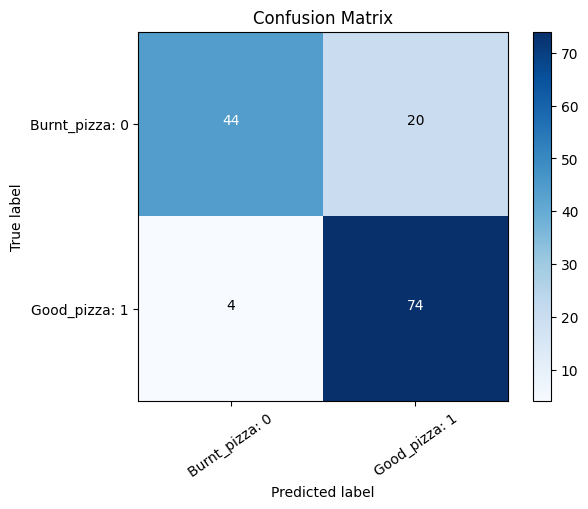

-----------------------------------------------------
Classification report
              precision    recall  f1-score   support

           0       0.92      0.69      0.79        64
           1       0.79      0.95      0.86        78

    accuracy                           0.83       142
   macro avg       0.85      0.82      0.82       142
weighted avg       0.85      0.83      0.83       142

-----------------------------------------------------
Accuracy of the model:  0.8309859154929577


In [ ]:
plot_confusion_metrix(test_y, pred_y, classes=["Burnt_pizza: 0","Good_pizza: 1"])

### Step 9: Generate Plots for acc and val 

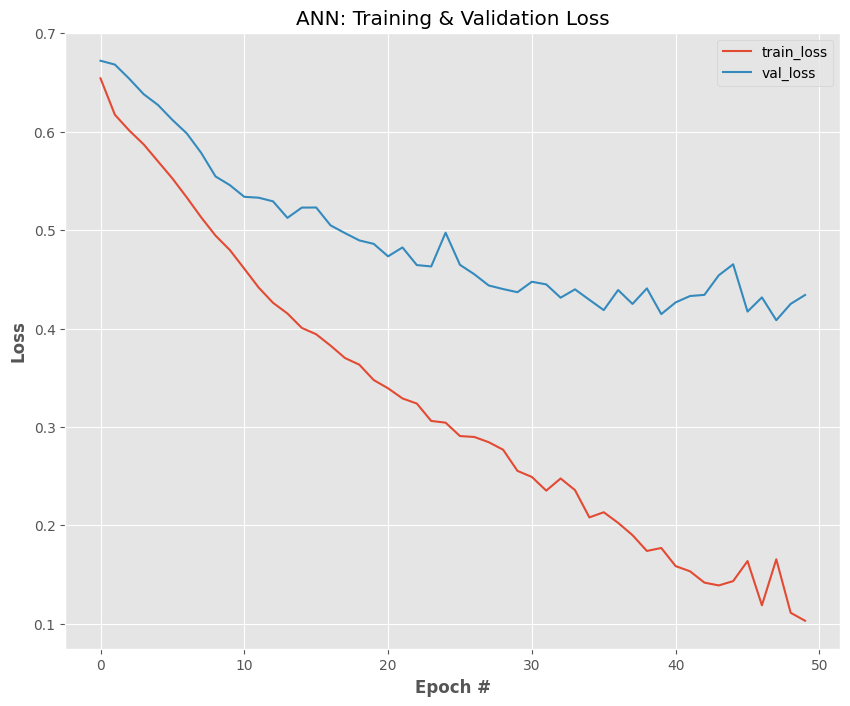

In [ ]:
# plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("ANN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

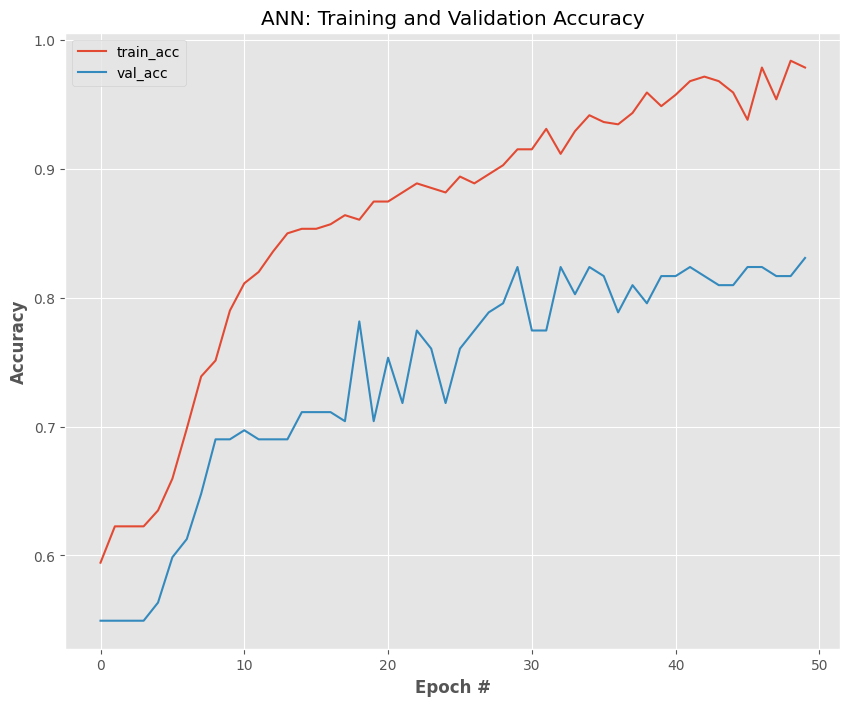

In [ ]:
# plot the training and validation accuracy
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("ANN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dense_1 (Dense)             (None, 800)               820000    
                                                                 
 dense_2 (Dense)             (None, 512)               410112    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 4,377,890
Trainable params: 4,377,890
Non-trainable params: 0
_________________________________________________________________


### Step 10: Saving the train model 

In [ ]:
# save the model and label binarizer to disk
print("[INFO] serializing network and label binarizer...")
model.save('model_ANN.h5')

[INFO] serializing network and label binarizer...


In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    # plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

### Step 11: Making predictions using your trained tensorflow model

In [ ]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2
import imutils
import matplotlib.pyplot as plt
%matplotlib inline

  0%|          | 0/40 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


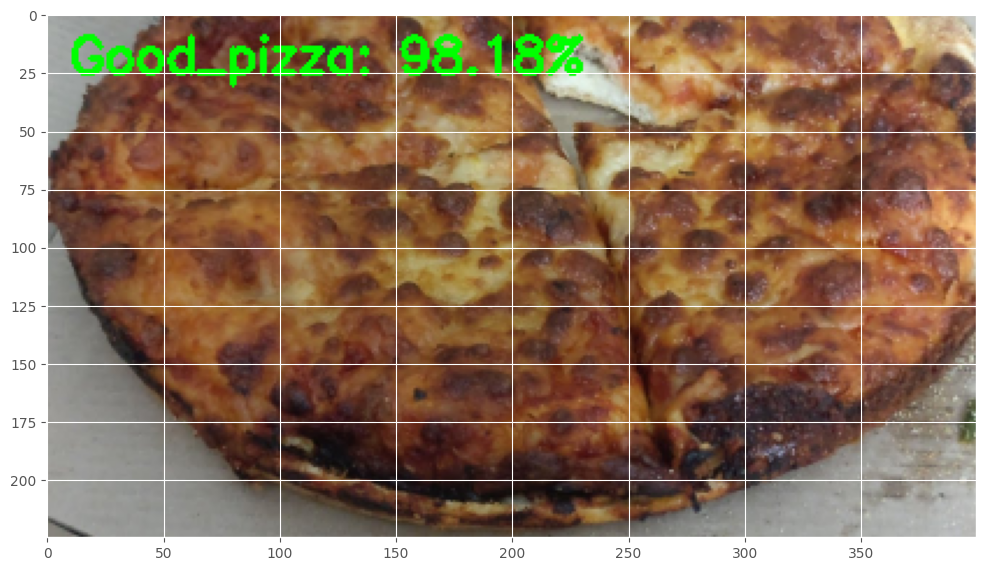

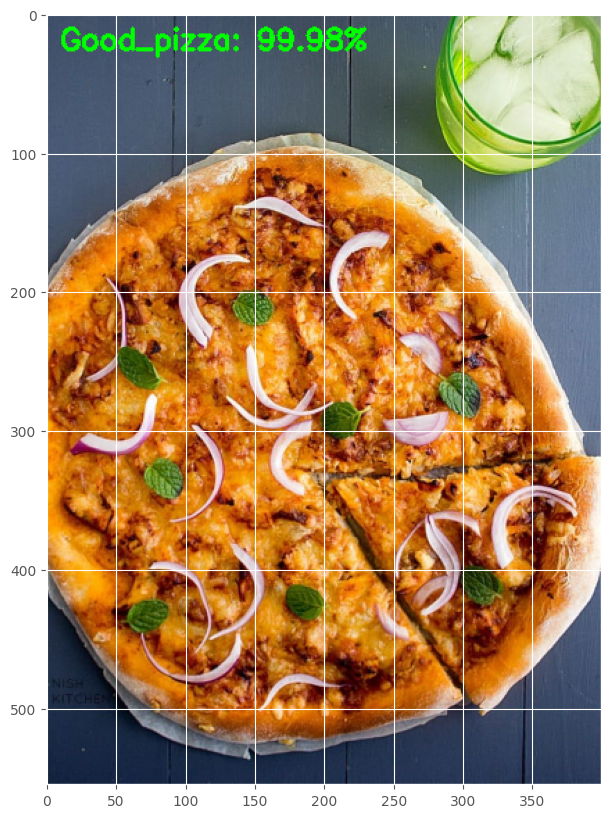

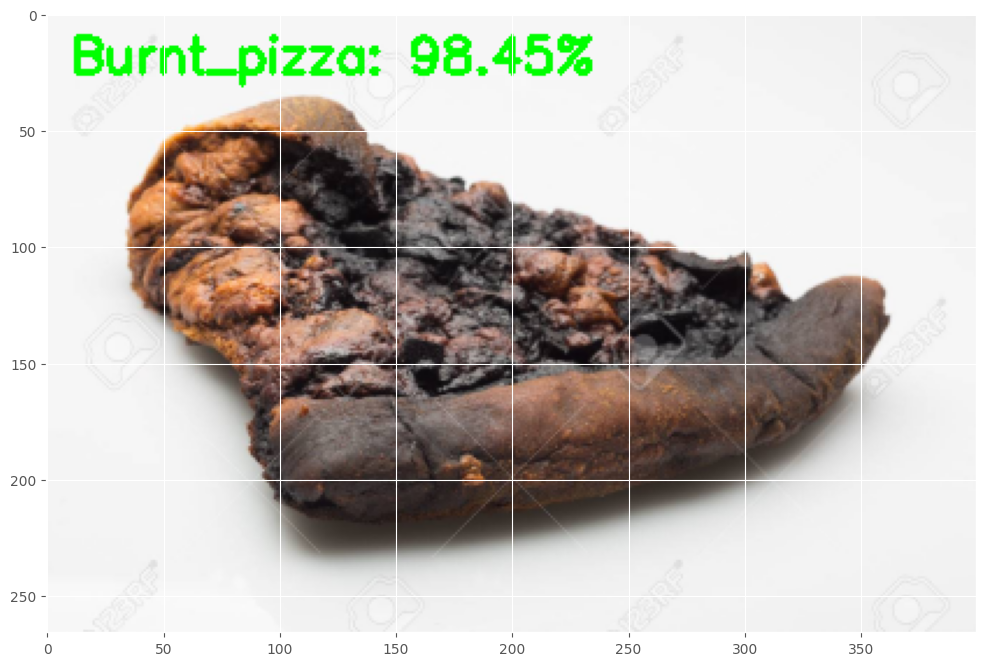

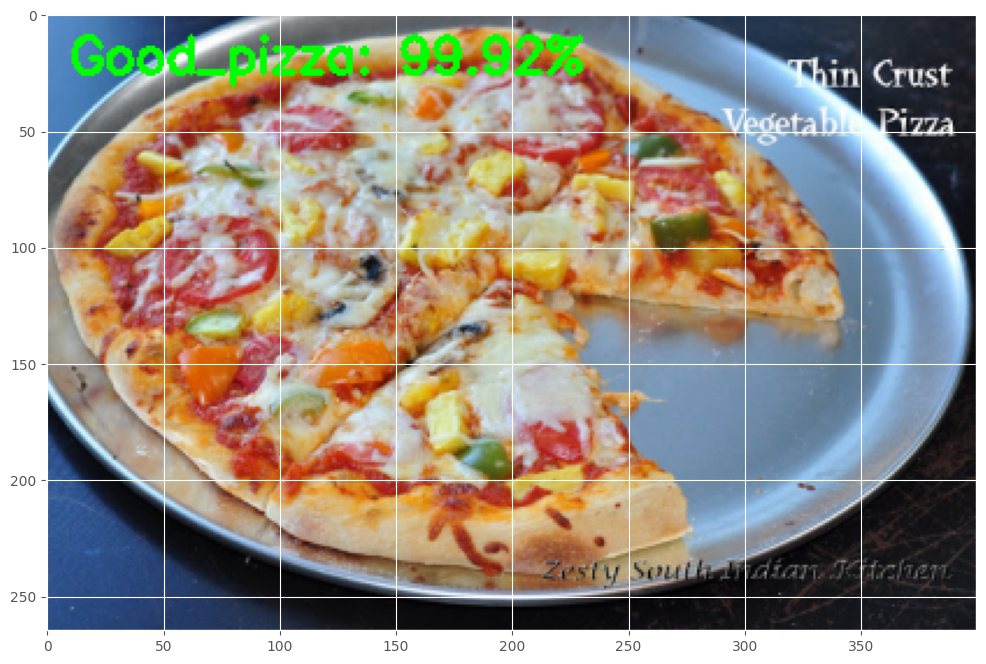

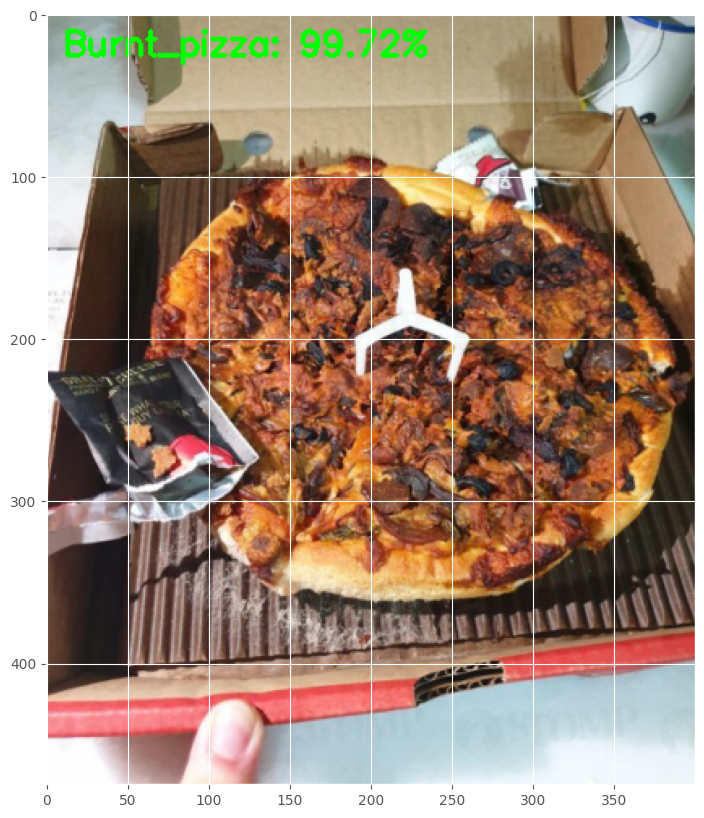

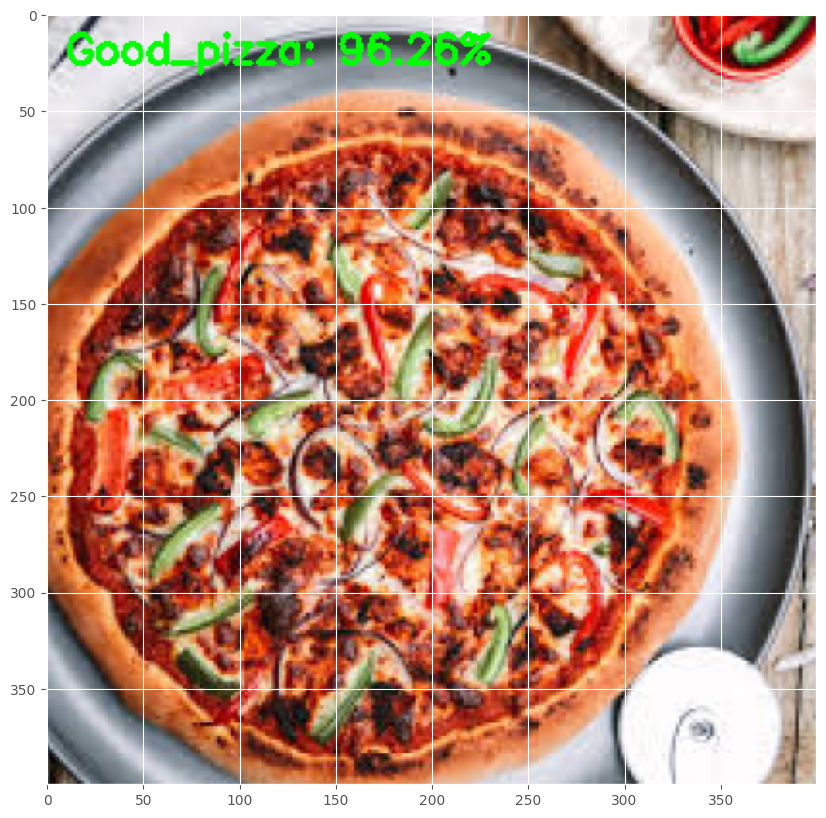

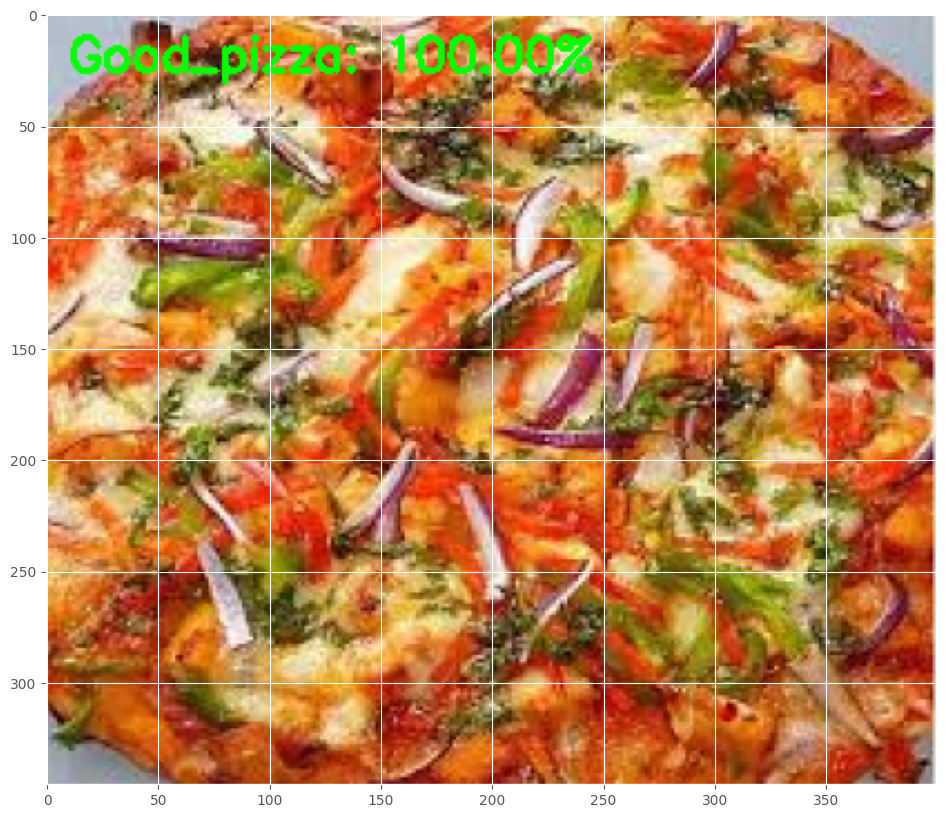

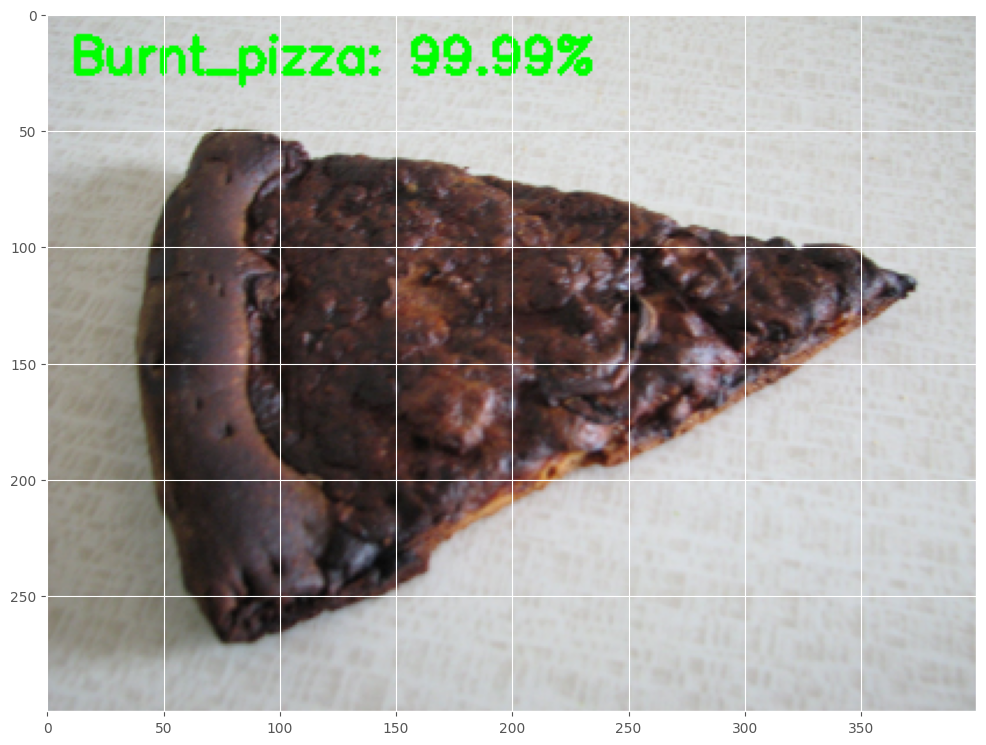

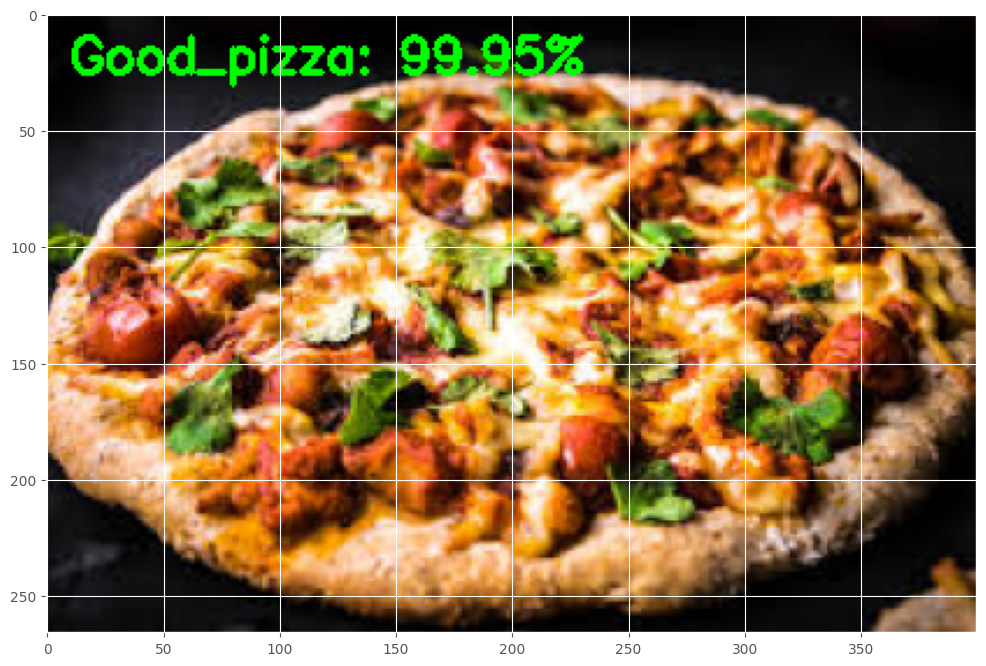

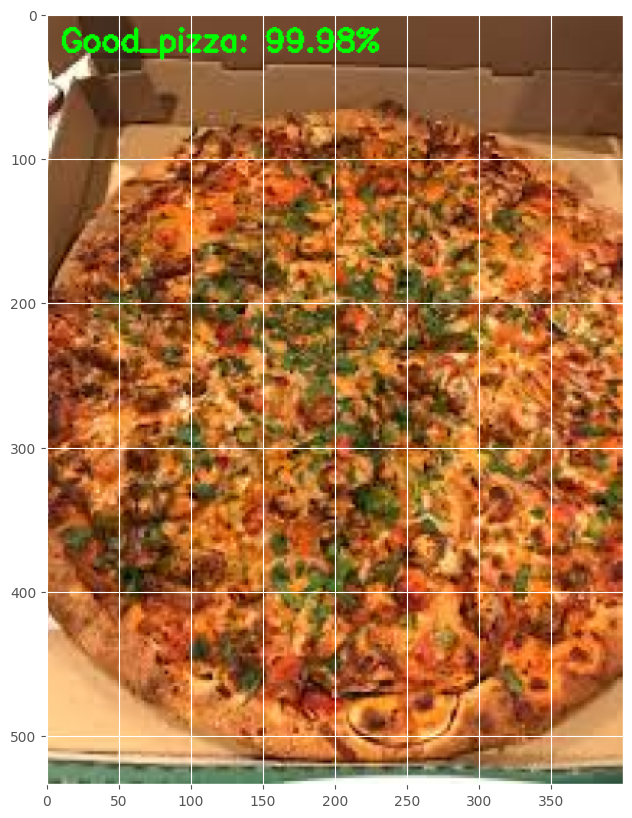

In [ ]:
# load the input image and resize it to the target spatial dimensions
width = 32
height = 32

# grab the image paths and randomly shuffle them
testImagePaths = sorted(list(paths.list_images('test')))   # test data folder with random images


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        image = cv2.imread(imagePath)
        output = image.copy()
        image = cv2.resize(image, (width, height))

        # scale the pixel values to [0, 1]
        image = image.astype("float") / 255.0

        # for a simple fully-connected network, flatten the image
        image = image.flatten()
        image = image.reshape((1, image.shape[0]))


        # make a prediction on the image
        preds = model.predict(image)

        # find the class label index with the largest corresponding probability
        i = preds.argmax(axis=1)[0]
        label = classes[i]
        
        label = "{}: {:.2f}%".format(label, preds[0][i] * 100)

        
        output = imutils.resize(output, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (0, 255, 0), 2)
        
        # convert img to rgb format and display in noteboo
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)


        
        pbar.update(1)

In [ ]:
#!pip install tensorflow 

In [ ]:
!pip install gradio
import gradio as gr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 61.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 75.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 

In [ ]:
def predict_image(image):
    
    image = cv2.resize(image, (32, 32))

    # scale the pixel values to [0, 1]
    image = image.astype("float") / 255.0

    # for a simple fully-connected network, flatten the image
    image = image.flatten()
    image = image.reshape((1, image.shape[0]))

    # make a prediction on the image
    preds = model.predict(image).flatten()
    result = dict()
    result["Burnt_pizza"] = round(float(list(preds)[0]), 3)
    result["Good_pizza"] = round(float(list(preds)[1]), 3)
    print(result)
    
    return result

im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=2)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="ANN Demo").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://6b313811dd8c42b58c.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces
